In [1]:
%cd ../
%matplotlib inline

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

In [3]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [4]:
affvids_db = niidb.FMriActivationsDb('data/affvids2018.db')

In [5]:
dtfa = DTFA.DeepTFA(affvids_db.all(_limit=200), mask='/data/eli/AffVids/wholebrain2.nii.gz', num_factors=25, embedding_dim=2)

05/10/2018 22:21:38 Loading Nifti image /data/eli/AffVids/nifti/sub-14_task-AffVids_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /data/eli/AffVids//nifti/wholebrain2.nii.gz (zscore=True)
05/10/2018 22:21:49 Loading Nifti image /data/eli/AffVids/nifti/sub-14_task-AffVids_run-02_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /data/eli/AffVids//nifti/wholebrain2.nii.gz (zscore=True)
05/10/2018 22:22:00 Loading Nifti image /data/eli/AffVids/nifti/sub-14_task-AffVids_run-03_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /data/eli/AffVids//nifti/wholebrain2.nii.gz (zscore=True)
05/10/2018 22:22:11 Loading Nifti image /data/eli/AffVids/nifti/sub-23_task-AffVids_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /data/eli/AffVids//nifti/wholebrain2.nii.gz (zscore=True)
05/10/2018 22:22:22 Loading Nifti image /data/eli/AffVids/nifti/sub-23_task-AffVids_run-02_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /data/eli/AffVids//nifti/wholebra

In [6]:
dtfa.load_state('data/sub-CHECK_05102018_140636')

In [7]:
def task_labeler(b):
    if 'heights' in b.task:
        return 'Heights'
    elif 'social' in b.task:
        return 'Social threat'
    elif 'spider' in b.task:
        return 'Spiders'
    elif 'rest' in b.task:
        return 'Rest'
    else:
        return None

def rest_task_labeler(b):
    if b.task == 'rest':
        return 'Rest'
    else:
        return 'Task'

In [8]:
dtfa.normalize_weights()

[(<matplotlib.colors.Normalize at 0x7f01e7100c18>,
  <matplotlib.colors.Normalize at 0x7f01e71010f0>),
 (<matplotlib.colors.Normalize at 0x7f01e7101588>,
  <matplotlib.colors.Normalize at 0x7f01e7101a20>),
 (<matplotlib.colors.Normalize at 0x7f01e7101eb8>,
  <matplotlib.colors.Normalize at 0x7f01e7104390>),
 (<matplotlib.colors.Normalize at 0x7f01e7104828>,
  <matplotlib.colors.Normalize at 0x7f01e7104cc0>),
 (<matplotlib.colors.Normalize at 0x7f01e7105198>,
  <matplotlib.colors.Normalize at 0x7f01e7105630>),
 (<matplotlib.colors.Normalize at 0x7f01e7105ac8>,
  <matplotlib.colors.Normalize at 0x7f01e7105f60>),
 (<matplotlib.colors.Normalize at 0x7f01e7107438>,
  <matplotlib.colors.Normalize at 0x7f01e71078d0>),
 (<matplotlib.colors.Normalize at 0x7f01e7107d68>,
  <matplotlib.colors.Normalize at 0x7f01e7108240>),
 (<matplotlib.colors.Normalize at 0x7f01e71086d8>,
  <matplotlib.colors.Normalize at 0x7f01e7108b70>)]

05/10/2018 22:23:55 Plotting factors for Participant 23, run 2
/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/nilearn/plotting/displays.py:1291: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':


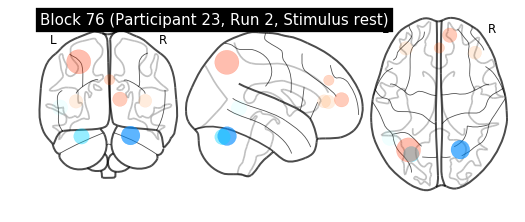

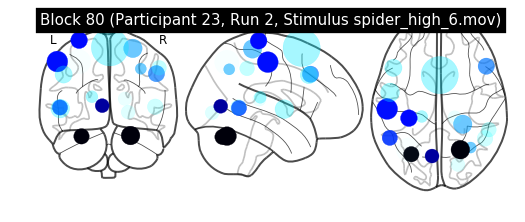

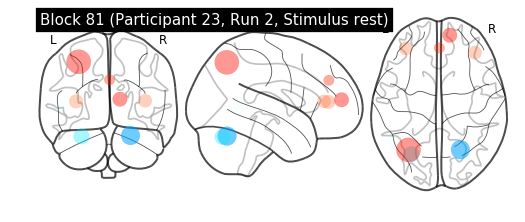

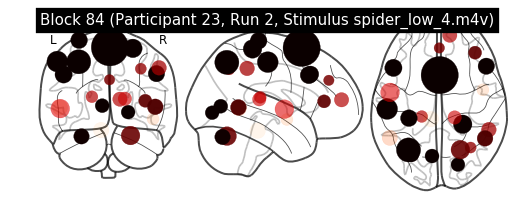

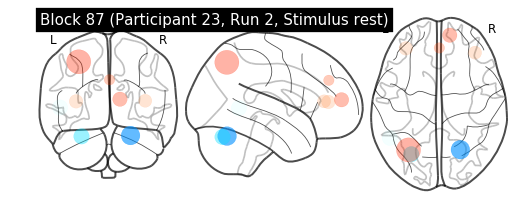

...

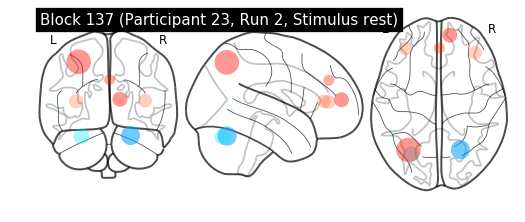

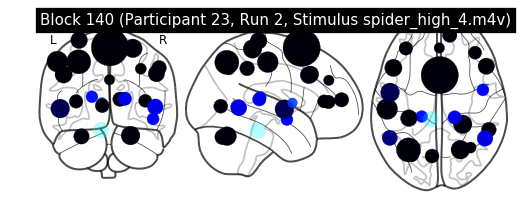

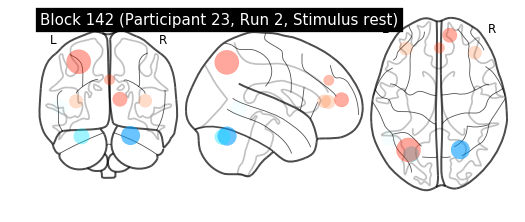

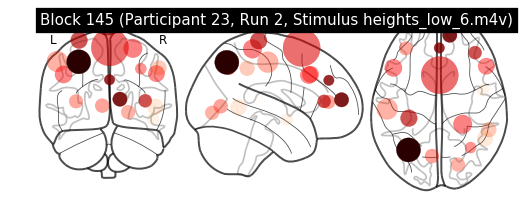

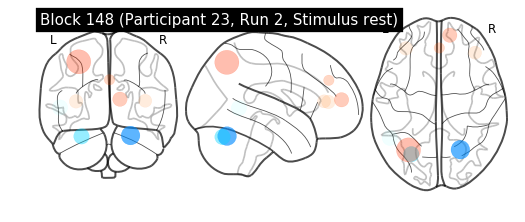

05/10/2018 22:24:18 Plotting factors for Participant 23, run 3


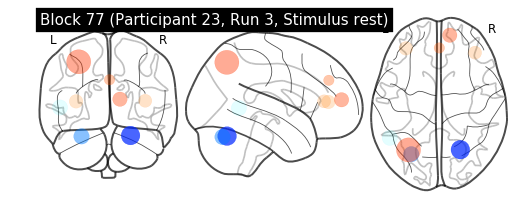

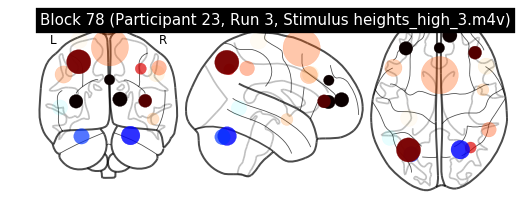

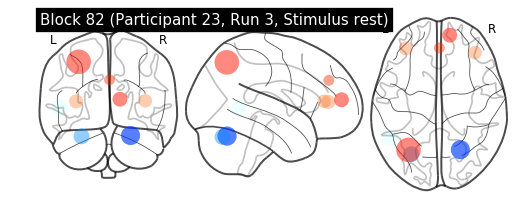

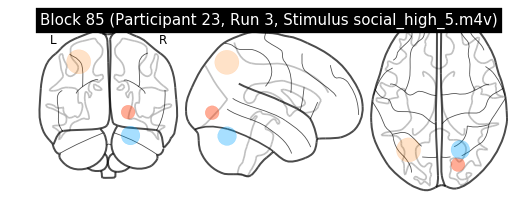

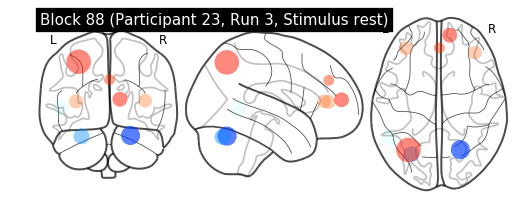

...

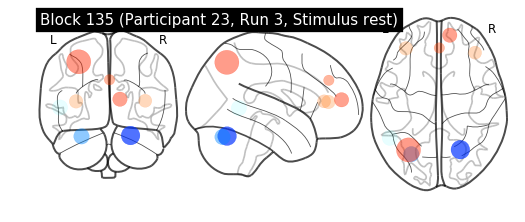

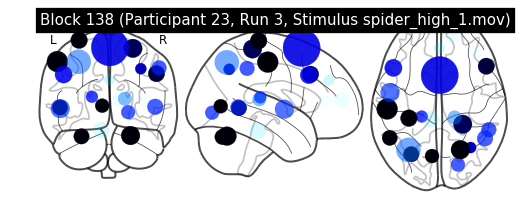

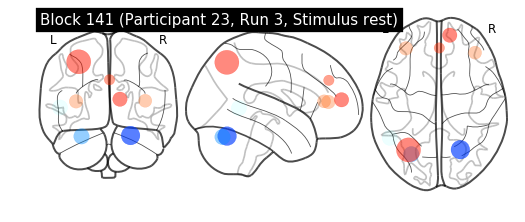

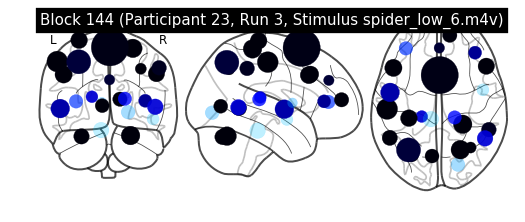

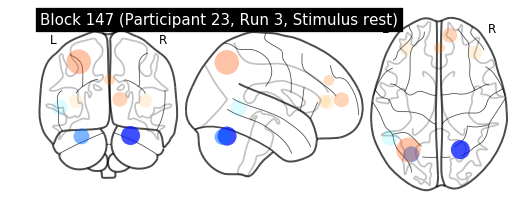

05/10/2018 22:24:42 Plotting factors for Participant 14, run 1


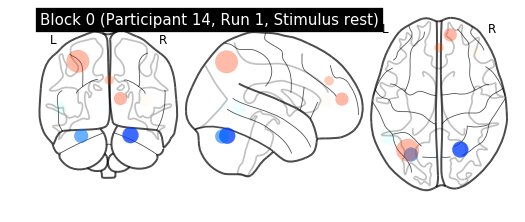

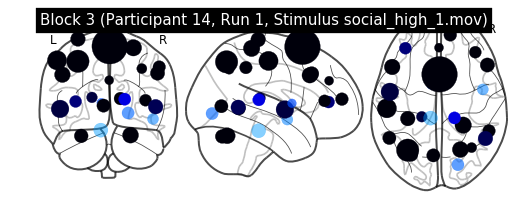

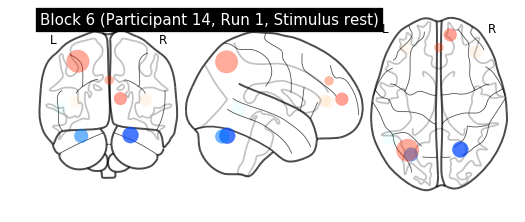

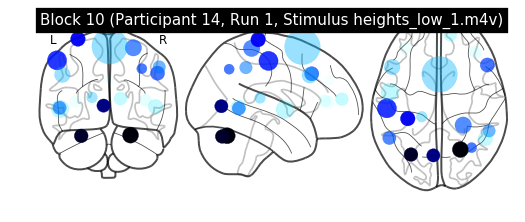

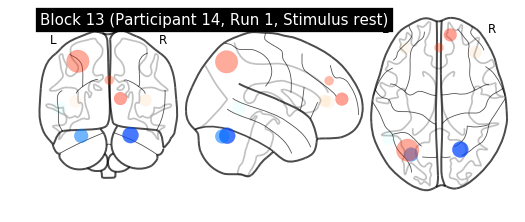

...

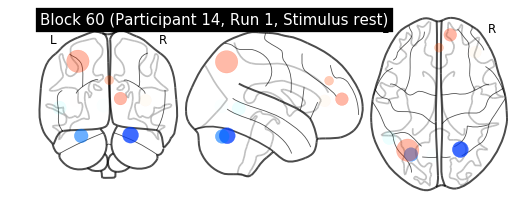

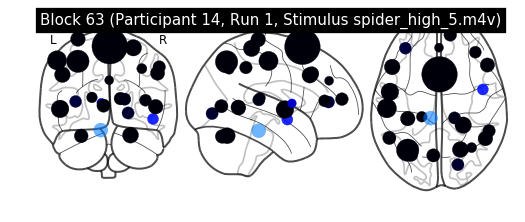

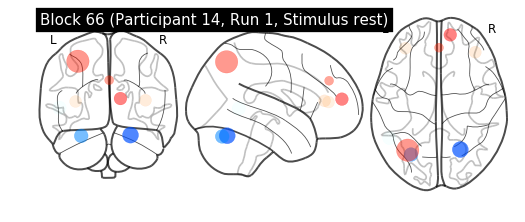

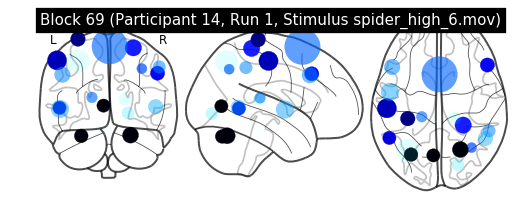

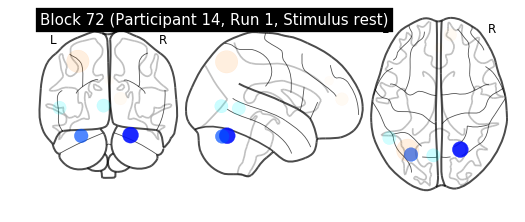

05/10/2018 22:25:06 Plotting factors for Participant 29, run 1


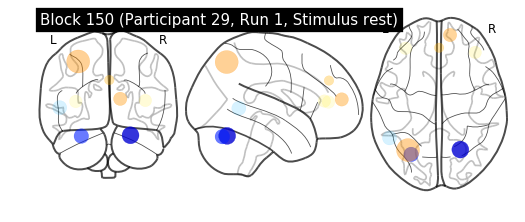

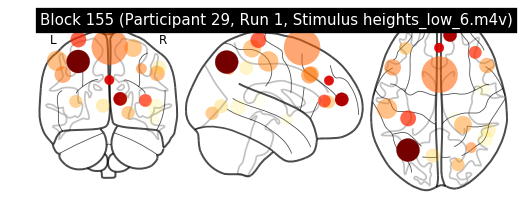

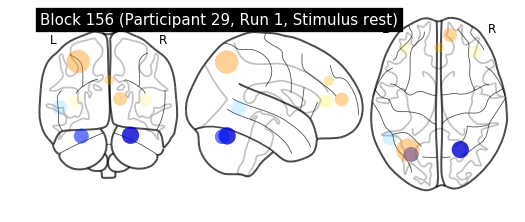

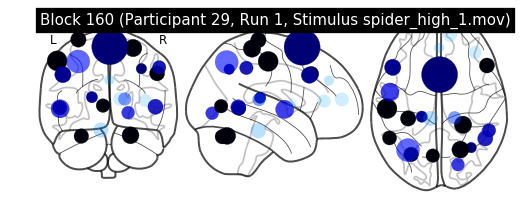

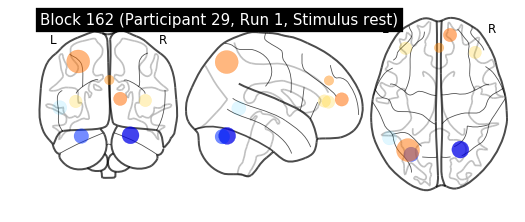

...

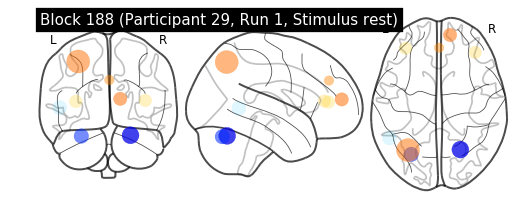

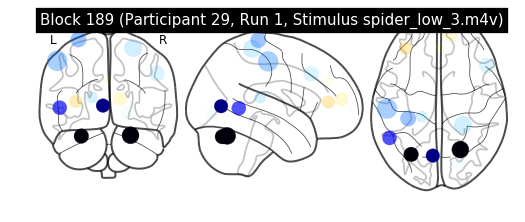

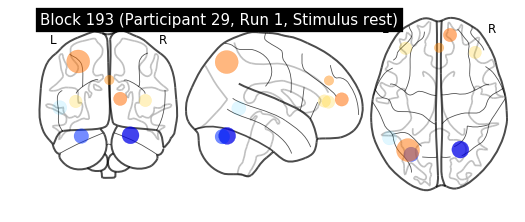

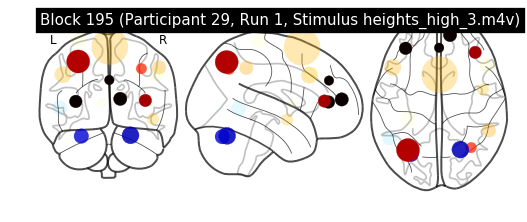

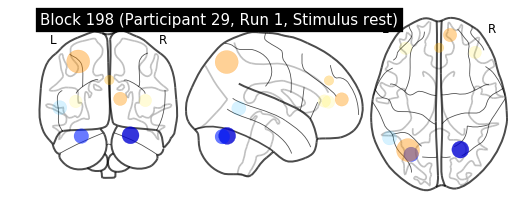

05/10/2018 22:25:22 Plotting factors for Participant 29, run 2


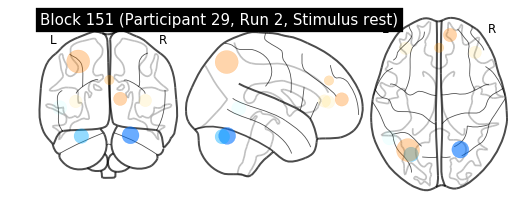

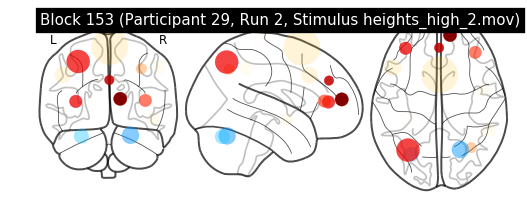

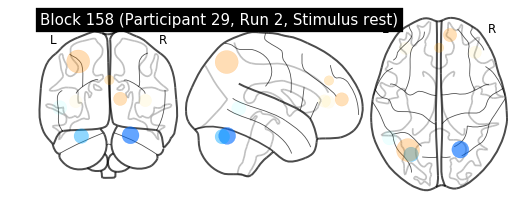

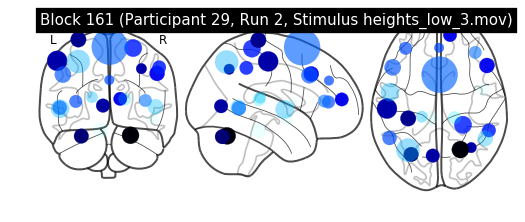

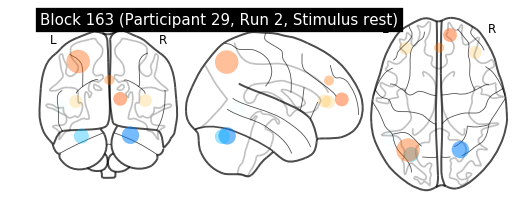

...

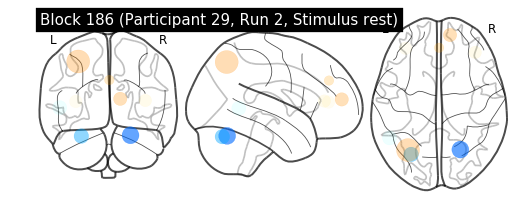

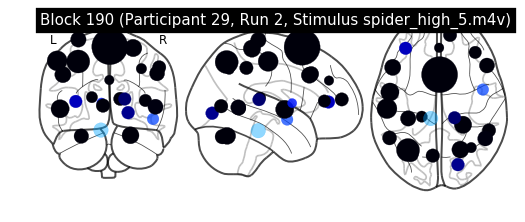

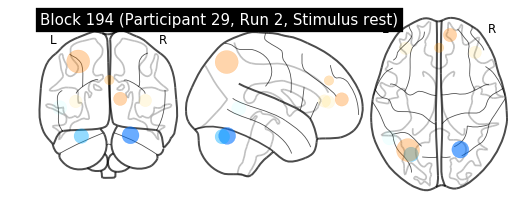

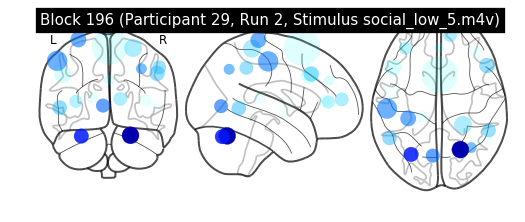

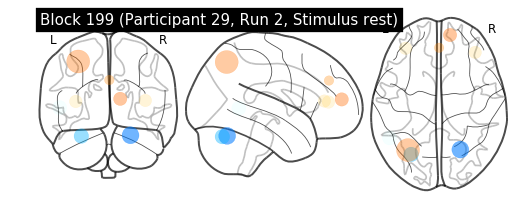

05/10/2018 22:25:38 Plotting factors for Participant 23, run 1


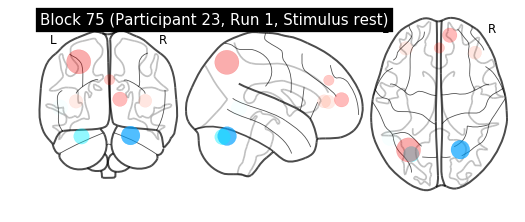

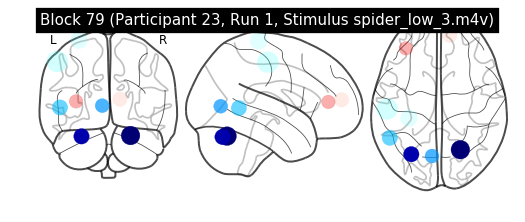

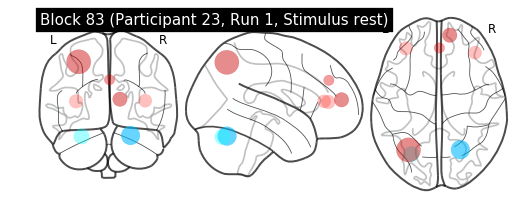

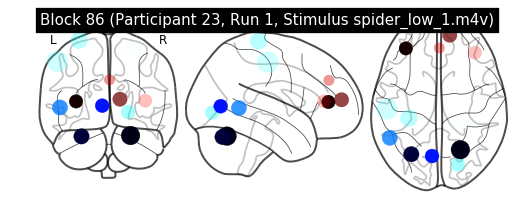

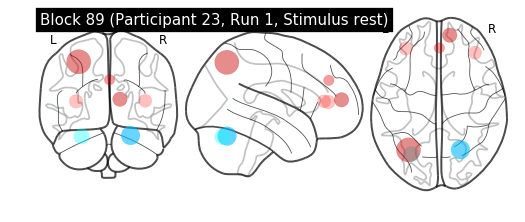

...

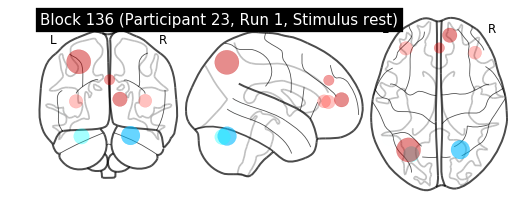

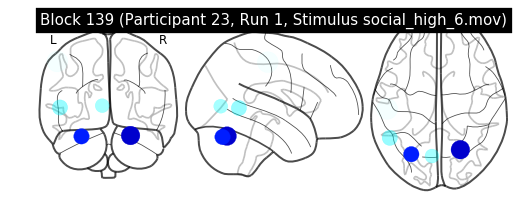

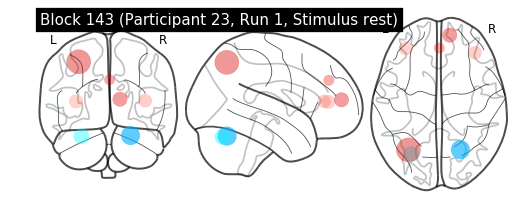

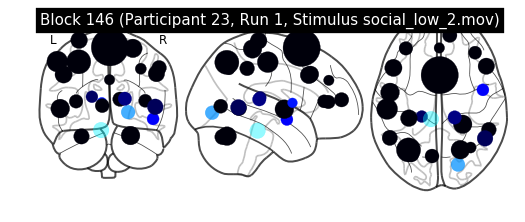

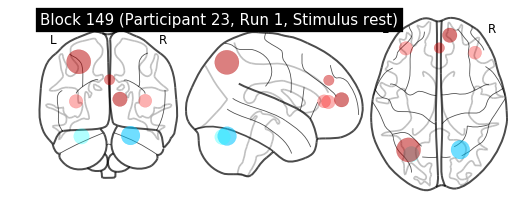

05/10/2018 22:26:02 Plotting factors for Participant 14, run 3


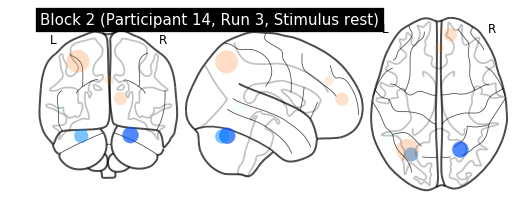

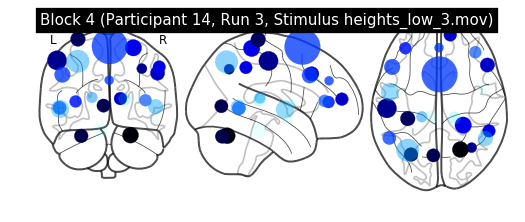

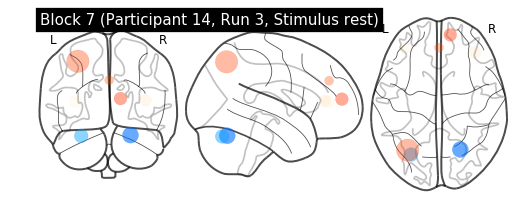

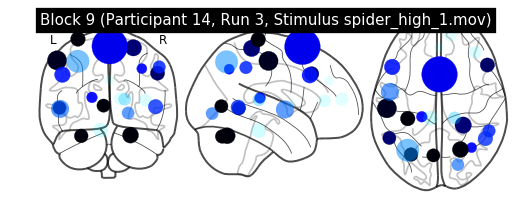

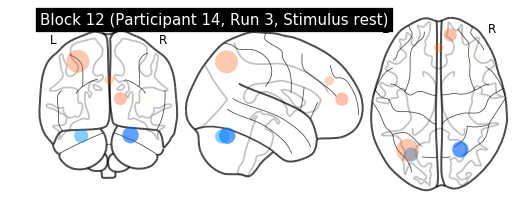

...

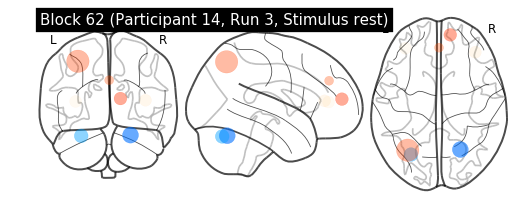

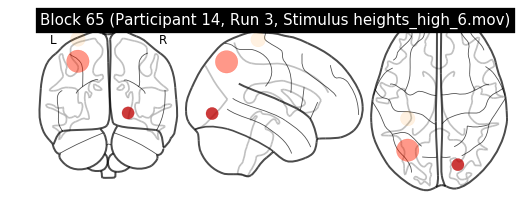

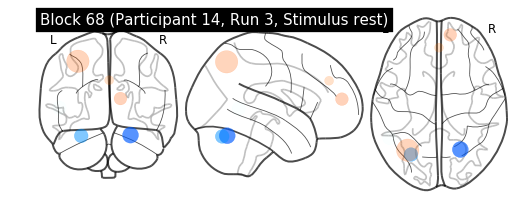

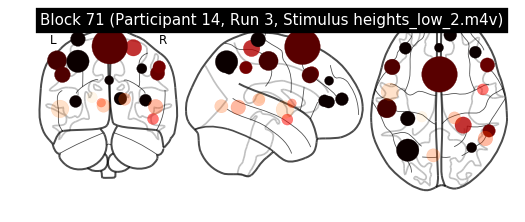

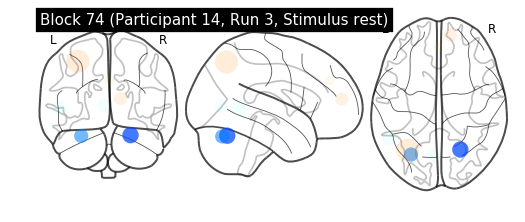

05/10/2018 22:26:26 Plotting factors for Participant 14, run 2


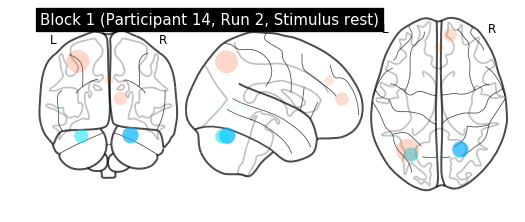

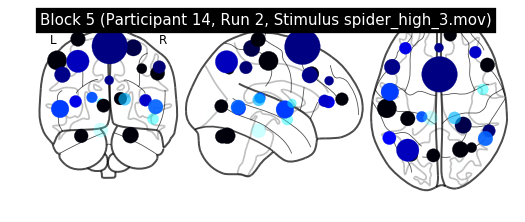

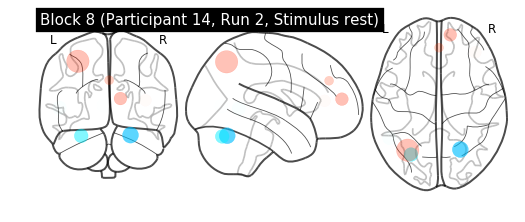

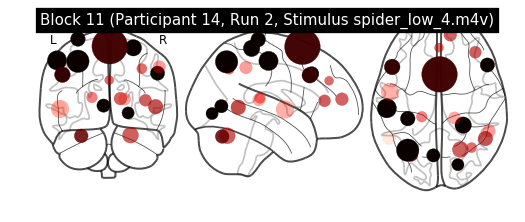

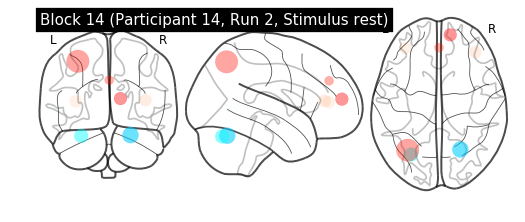

...

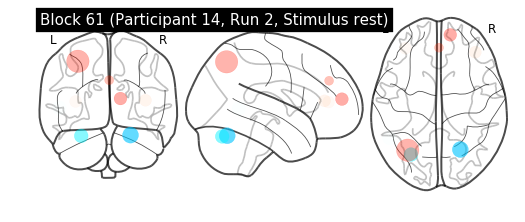

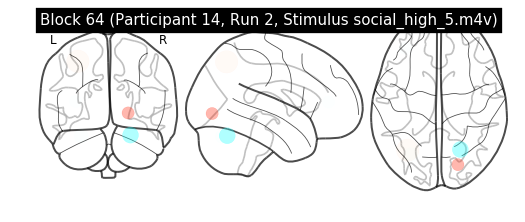

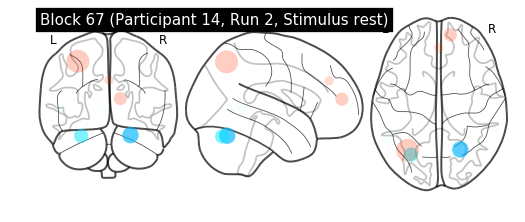

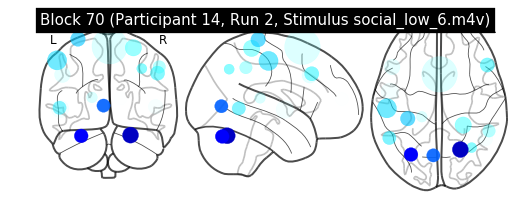

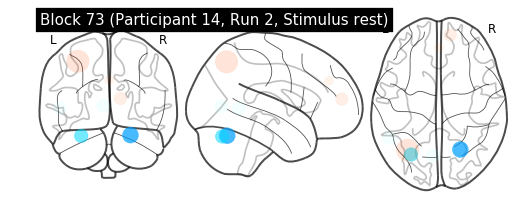

05/10/2018 22:26:51 Plotting factors for Participant 29, run 3


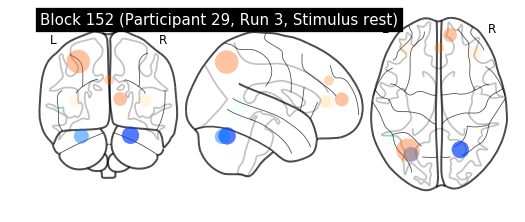

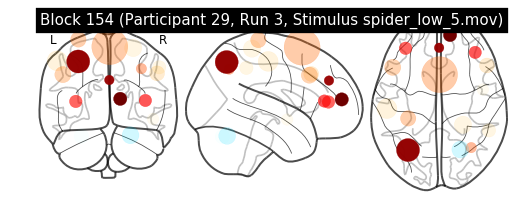

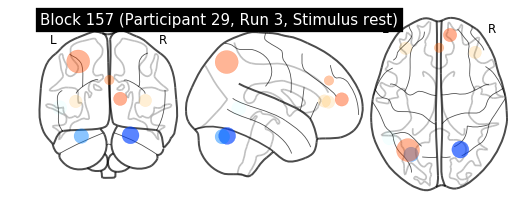

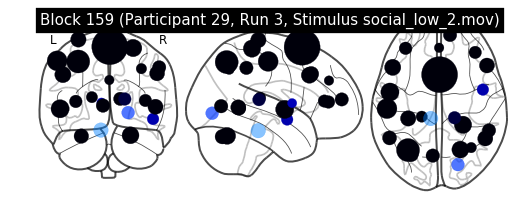

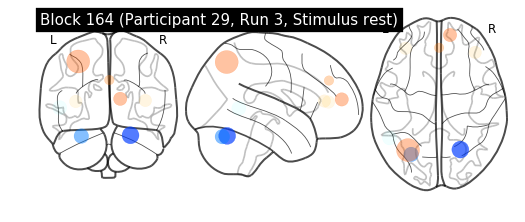

...

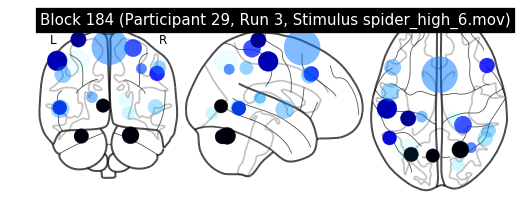

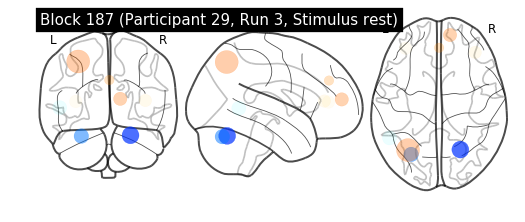

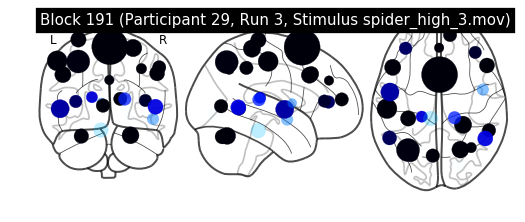

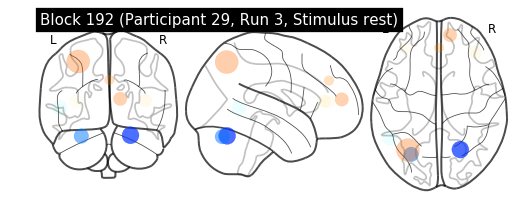

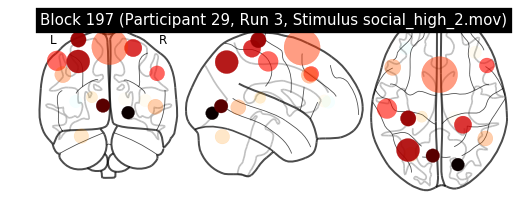

In [9]:
subject_runs = set([(block.subject, block.run) for block in dtfa._blocks])

for (subject, run) in subject_runs:
    logging.info('Plotting factors for Participant %d, run %d' % (subject, run))
    blocks = [block for block in dtfa._blocks if block.subject == subject and block.run == run]
    blocks.sort(key=lambda b: b.start_time)
    for block in blocks:
        index = dtfa._blocks.index(block)
        dtfa.plot_factor_centers(index)


/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


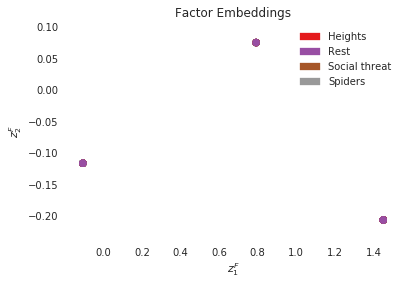

In [10]:
dtfa.scatter_factor_embedding(labeler=task_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


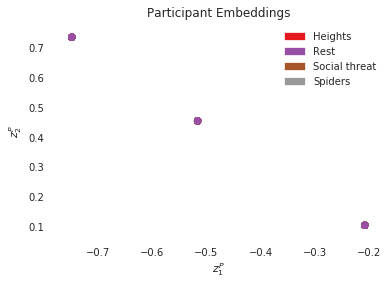

In [11]:
dtfa.scatter_subject_embedding(labeler=task_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


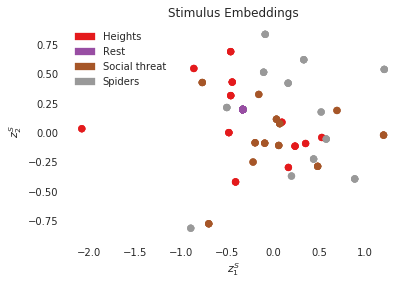

In [12]:
dtfa.scatter_task_embedding(t=None, labeler=task_labeler, figsize=None)

In [13]:
def subject_labeler(block):
    return 'Subject %d' % block.subject

def subject_run_labeler(block):
    return 'sub%drun%d' % (block.subject, block.run)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


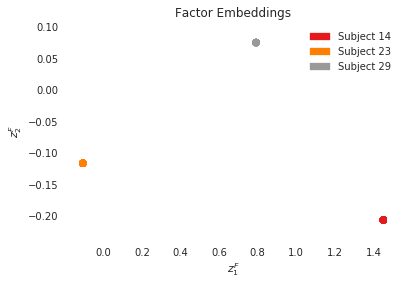

In [14]:
dtfa.scatter_factor_embedding(labeler=subject_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


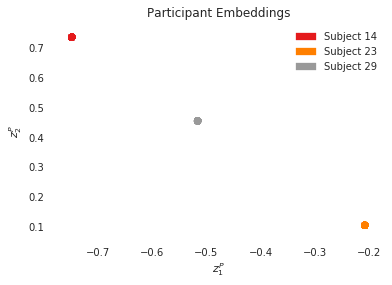

In [15]:
dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


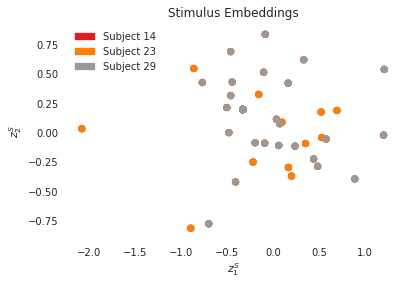

In [16]:
dtfa.scatter_task_embedding(t=None, labeler=subject_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


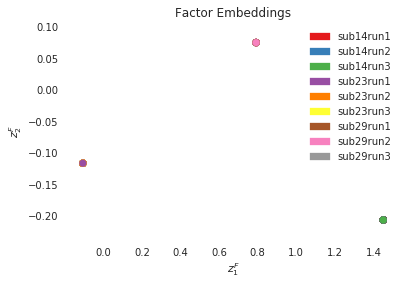

In [17]:
dtfa.scatter_factor_embedding(labeler=subject_run_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


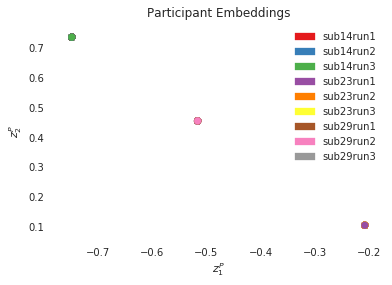

In [18]:
dtfa.scatter_subject_embedding(labeler=subject_run_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


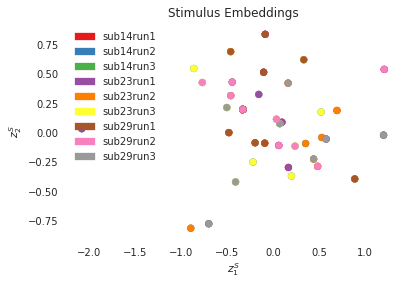

In [19]:
dtfa.scatter_task_embedding(t=None, labeler=subject_run_labeler, figsize=None)

In [20]:
def run_labeler(block):
    return str(block.run)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


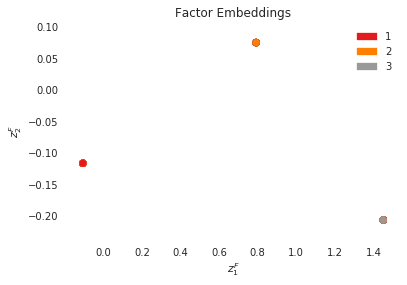

In [21]:
dtfa.scatter_factor_embedding(labeler=run_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


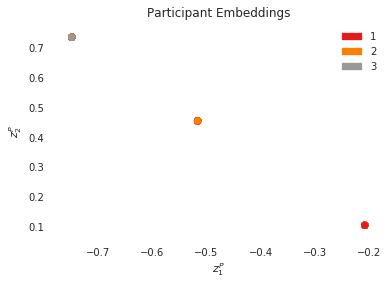

In [22]:
dtfa.scatter_subject_embedding(labeler=run_labeler, figsize=None)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


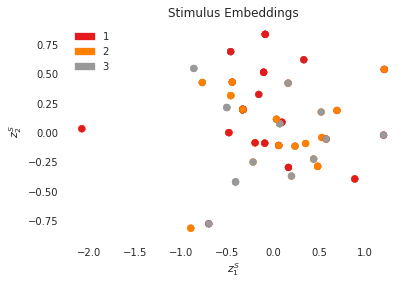

In [23]:
dtfa.scatter_task_embedding(t=None, labeler=run_labeler, figsize=None)